Import libraries

In [2]:
import pandas as pd
import bamboolib as bam
import csv
import requests
#Import self-defined functions
from capstone_group2 import api
from capstone_group2 import fill_missing_values
!pip install folium
import pandas as pd
import folium
from folium.plugins import MarkerCluster
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
! pip install squarify
import plotly.express as px
import squarify
#Import self-defined function
from capstone_group2 import culmap
from IPython.display import display 
import calendar
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
!pip install mplcursors
import mplcursors
import statsmodels.api as sm
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

In [3]:
def clean_crime_data(crime):
    # Drop unwanted columns
    crime = crime.drop(columns=['OFFENSE_CODE_GROUP','UCR_PART','_id'])
    
    # Group by district and fill missing values with mean
    district_means = crime.groupby('DISTRICT')[['Lat', 'Long']].mean()
    crime[['Lat', 'Long']] = crime.groupby('DISTRICT')[['Lat', 'Long']].transform(lambda x: x.fillna(x.mean()))
    
    # Fill missing location values with (Lat, Long) if available
    crime['Location'] = crime.apply(lambda row: f'({row["Lat"]}, {row["Long"]})' if pd.isna(row["Location"]) else row["Location"], axis=1)
    
    return crime

Map of Boston with crime incident clusters

In [4]:

def cluster_map(crime):
# Group data by location
    grouped_data = crime.groupby(['Lat', 'Long']).size().reset_index(name='count')

# Define clusters
    num_clusters = 5
    cluster_data = grouped_data[['Lat', 'Long']]
    kmeans = KMeans(n_clusters=num_clusters).fit(cluster_data)
    grouped_data['cluster'] = kmeans.labels_

# Create map
    crime_map = folium.Map(location=[grouped_data['Lat'].mean(), grouped_data['Long'].mean()], zoom_start=12)

# Add cluster markers
    marker_cluster = MarkerCluster().add_to(crime_map)
    for i, row in grouped_data.iterrows():
        popup_text = "Location: {},{}<br>Number of Crimes: {}".format(row['Lat'], row['Long'], row['count'])
        folium.Marker(location=[row['Lat'], row['Long']], popup=popup_text).add_to(marker_cluster)

# Show map
    return(crime_map)

Number of Crimes by Day

In [5]:

def crime_plot(crime):
    # get the counts of each day of the week
    day_counts = crime["DAY_OF_WEEK"].value_counts()

# define the order of days of the week
    day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# create a bar plot using seaborn
    sns.barplot(x=day_order, y=day_counts.loc[day_order], palette="deep")

# set the title and axis labels
    plt.title("Number of Crimes by Day of Week")
    plt.xlabel("Day of Week")
    plt.ylabel("Number of Crimes")

    plt.xticks(rotation=45)


# show the plot
    return(plt.show())

    





Areas of shooting

In [6]:

def area_shoot(crime):
# Filter shooting incidents
    shooting_data = crime[crime["SHOOTING"] == 1]

# Create a folium map centered on Boston
    map_shooting = folium.Map(location=[42.361145, -71.057083], zoom_start=12)

# Add markers for each shooting incident with district name as hover
    for index, row in shooting_data.iterrows():
        folium.Marker(location=[row['Lat'], row['Long']], 
                  popup=row['STREET'], 
                  icon=folium.Icon(color='red')).add_to(map_shooting)

# Display the map
    return(map_shooting)

#area_shoot(crime)

Treemap for offense

In [7]:

def offense_tree(crime):
# Get the top 5 offense descriptions
    top_offense_desc = crime['OFFENSE_DESCRIPTION'].value_counts().nlargest(5).index.tolist()

# Filter the data to only include the top 5 offense descriptions
    top_crime_data = crime[crime['OFFENSE_DESCRIPTION'].isin(top_offense_desc)]

# Create the treemap figure
    fig = px.treemap(top_crime_data, 
                 path=['OFFENSE_DESCRIPTION'], 
                 color='OFFENSE_DESCRIPTION',
                 color_discrete_sequence=px.colors.qualitative.Vivid,
                 hover_data={'OFFENSE_DESCRIPTION': True})

# Update the layout
    fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))

# Show the figure
    return(fig.show())


#offense_tree(crime)


Trend of crimes

In [8]:
def crime_trend(crime):
    # Convert OCCURRED_ON_DATE column to datetime type
    crime['OCCURRED_ON_DATE'] = pd.to_datetime(crime['OCCURRED_ON_DATE'])

# Group by date and count the number of crimes on each date
    crimes_by_date = crime.groupby(crime['OCCURRED_ON_DATE'].dt.date).size()

# Create a line plot of the data
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(crimes_by_date.index, crimes_by_date.values)

# Set plot title and labels
    ax.set_title('Trend of Crimes by Date')
    ax.set_xlabel('Date')
    ax.set_ylabel('Number of Crimes')

# Show plot
    return(plt.show())



Crime types plot

In [9]:
def crime_type(crime):
    counts = crime['OFFENSE_DESCRIPTION'].value_counts()
#Filter top 5 crimes based on counts
    data = {'TypeOfCrime': list(counts.index[0:5]),
        'No.Of.Report': list(counts.values[0:5])}
    lten = list(counts.index[0:9])
    Tten = pd.DataFrame(data)
    plt.figure(figsize=(8,6))
    sns.barplot(data =Tten , x = 'TypeOfCrime',y =  'No.Of.Report')

# Set plot title and labels
    plt.title("Top 5 crimes by Type")
    plt.xlabel("Type of Crime")
    plt.ylabel("Number of crime")
    plt.xticks(rotation=45,size = 5)
    return(plt.show())


Monthwise crime graph

In [10]:
def month_crime():
    dfmon = crime['MONTH'].value_counts()
    data = {'Month': list(dfmon.index[0:]),
        'No.Of.Crimes': list(dfmon.values[0:])}
    mon = pd.DataFrame(data)
    # define a lambda function to map month numbers to abbreviations
    month_to_abbr = lambda month_num: calendar.month_abbr[month_num]
    mon['Month'] = mon['Month'].apply(month_to_abbr)
    plt.plot(mon['Month'], mon['No.Of.Crimes'],'-ok', color='gray')

    # Set plot title and labels
    plt.title("Crimes in each month")
    plt.xlabel("Month")
    plt.ylabel("Number of crimes")
    return(plt.show())


Barplot for offenses by time of day

In [11]:
def offense():#Filtering data based on hour metric
    counts = crime['OFFENSE_DESCRIPTION'].value_counts()
    data = {'TypeOfCrime': list(counts.index[0:5]),
        'No.Of.Report': list(counts.values[0:5])}
    lten = list(counts.index[0:9])
    Tten = pd.DataFrame(data)
    pre_data = crime[crime['HOUR']<=8]
    pre_data = pre_data['OFFENSE_DESCRIPTION'].value_counts()
    pre_data = {'OFF': list(pre_data.index[0:]),
        'No': list(pre_data.values[0:])}
    pre_data =  pd.DataFrame(pre_data)
    fdfpre = pre_data[pre_data['OFF'].isin(lten)]
    fdfpre = fdfpre.sort_values(by=['OFF'])
    post_data = crime[crime['HOUR']>8]
    post_data = post_data['OFFENSE_DESCRIPTION'].value_counts()
    post_data = {'OFF': list(post_data.index[0:]),
        'No': list(post_data.values[0:])}
    post_data =  pd.DataFrame(post_data)
    fdfpost = post_data[post_data['OFF'].isin(lten)]
    fdfpost = fdfpost.sort_values(by=['OFF'])

    X_axis = np.arange(len(lten))
  
    plt.bar(X_axis - 0.2, fdfpre['No'], 0.4, label = 'Midnight')
    plt.bar(X_axis + 0.2, fdfpost['No'], 0.4, label = 'Daytime')
  
    plt.xticks(X_axis, fdfpre['OFF'])
    plt.xlabel("Type of Crimes")
    plt.ylabel("Number of Offenses")
    plt.title("Number of offenses in each Crime")
    plt.xticks(rotation=45,size = 5)
    plt.legend()
    return(plt.show())



Heatmap for shooting

In [12]:
def heatmap_shoot(shooting_data):
    fig = px.density_mapbox(shooting_data, lat='Lat', lon='Long', z='SHOOTING', radius=10,
                        center=dict(lat=42.361145, lon=-71.057083), zoom=10,
                        mapbox_style="stamen-terrain",title = "HeatMap for Shooting")
    return(fig.show())
    


In [13]:
def split_data(crime):
    df = crime
    # encoding categorical variables
    
    le = LabelEncoder()
    df['DISTRICT'] = le.fit_transform(crime['DISTRICT'])
    df['DAY_OF_WEEK'] = le.fit_transform(crime['DAY_OF_WEEK'])
    df['STREET'] = le.fit_transform(crime['STREET'])

    # selecting the features and target variable
    X = df[['DISTRICT', 'DAY_OF_WEEK', 'HOUR', 'STREET']]
    y = df['SHOOTING']

    # Load dataset and split into train and test data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    return X_train, X_test, y_train, y_test



Logistic regression to predict shooting

In [14]:

def logistic():# Initialize logistic regression model and fit on training data
    model = LogisticRegression()
    model.fit(X_train, y_train)

# Make predictions on test data and calculate accuracy
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    return(model,accuracy, y_pred)

#model, accuracy, y_pred = logistic()



In [15]:
def roc(model):
#logistic regression model and X_test and y_test are our test data
    y_score = model.predict_proba(X_test)[:,1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

# Plot ROC Curve
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    return(plt.show())
    

In [16]:

def confusion_log():# logistic regression model with X_test and y_test
    y_pred = model.predict(X_test)
    conf_mat = confusion_matrix(y_test, y_pred)

# Plot Confusion Matrix with hover function
    fig, ax = plt.subplots()
    sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='g', ax=ax)

# Add hover function to the heatmap
    text = []
    for i in range(conf_mat.shape[0]):
        row = []
        for j in range(conf_mat.shape[1]):
            row.append(f'True:{i}<br>Pred:{j}<br>{conf_mat[i, j]}')
        text.append(row)

    cursor = mplcursors.cursor(ax.imshow(conf_mat, cmap='Blues'))
# Set labels and title
    ax.set_xlabel('Predicted value')
    ax.set_ylabel('True values')
    ax.set_title('Confusion Matrix')

    return(plt.show())


#confusion_log()


Decision Tree to predict shooting

In [17]:
def tree():

    class_weights = {0: 0.1, 1: 0.9}

# building the decision tree classifier
    dtc = DecisionTreeClassifier(criterion="gini", random_state=42,max_depth=3, min_samples_leaf=5, class_weight=class_weights )   

    dtc.fit(X_train, y_train)

# making predictions on the testing set
    y_pred = dtc.predict(X_test)

# calculating the accuracy of the model
    accuracy = accuracy_score(y_test, y_pred)
    plt.figure(figsize = (25,10))

    return(dtc,accuracy,y_pred)


#dtc, accuracy, y_pred = tree()

<h1> Main function to call all functions </h1>

STREET                  object
OFFENSE_DESCRIPTION     object
SHOOTING                 int64
OFFENSE_CODE             int64
DISTRICT                object
REPORTING_AREA          object
OCCURRED_ON_DATE        object
DAY_OF_WEEK             object
MONTH                    int64
HOUR                     int64
Long                   float64
YEAR                     int64
Lat                    float64
INCIDENT_NUMBER          int64
_id                      int64
OFFENSE_CODE_GROUP     float64
UCR_PART               float64
Location                object
dtype: object
STREET                  object
OFFENSE_DESCRIPTION     object
SHOOTING                 int32
OFFENSE_CODE             int32
DISTRICT                object
REPORTING_AREA          object
OCCURRED_ON_DATE        object
DAY_OF_WEEK             object
MONTH                    int32
HOUR                     int32
Long                   float64
YEAR                     int32
Lat                    float64
INCIDENT_NUMBER          

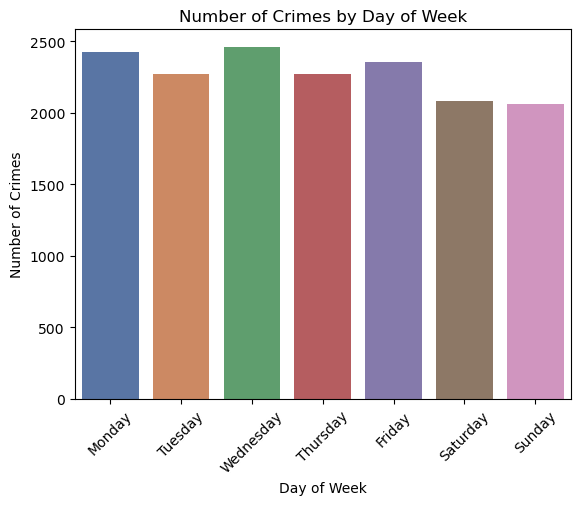

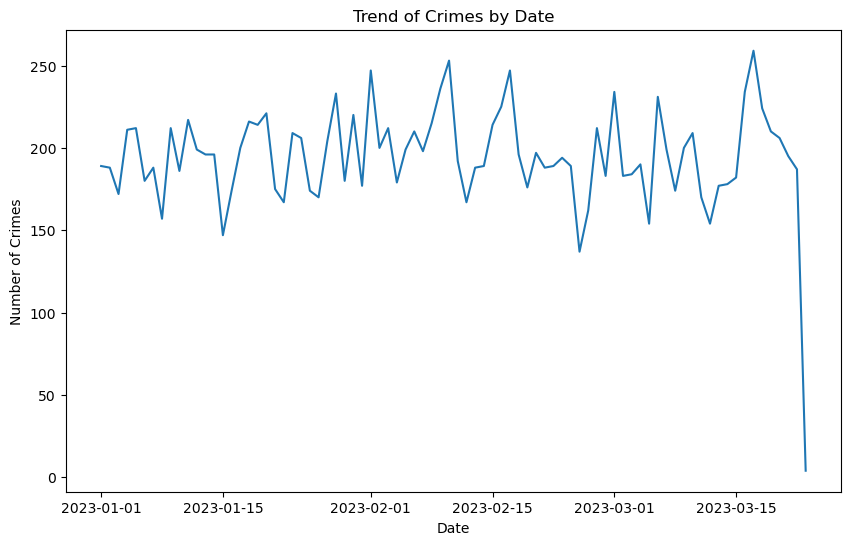

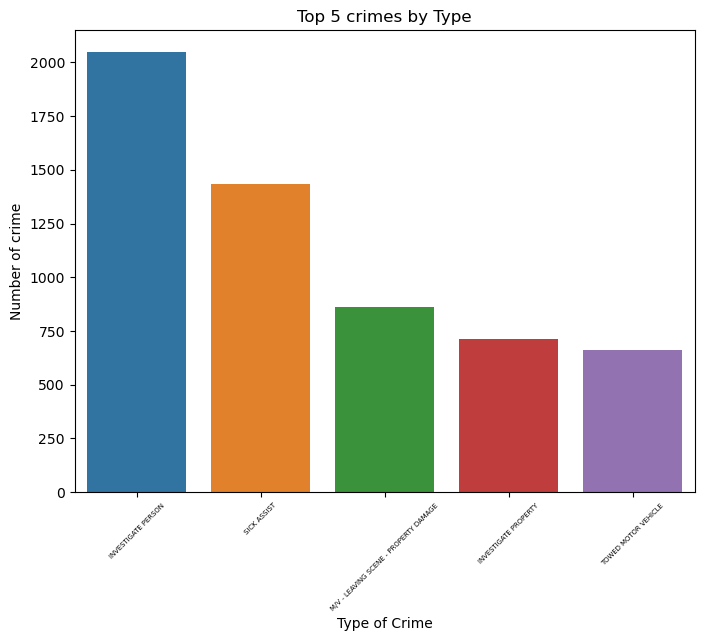

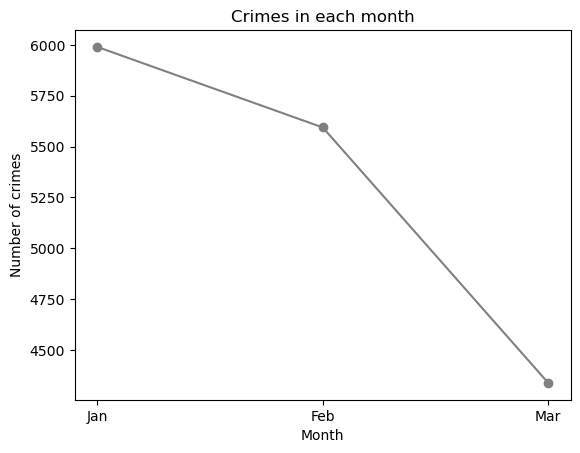

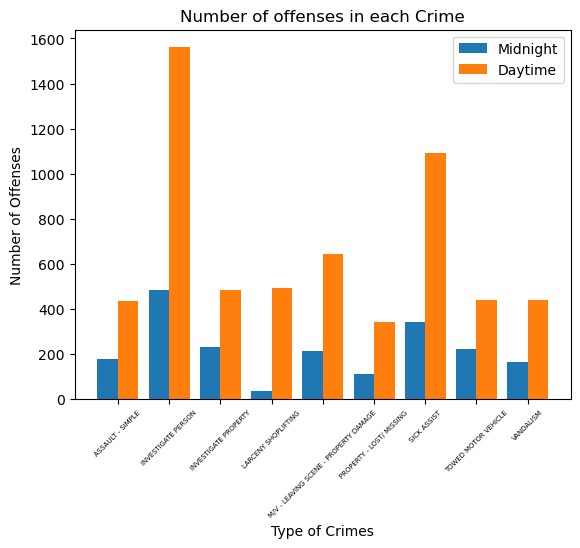

Accuracy of Logistic Regression: 99.15%


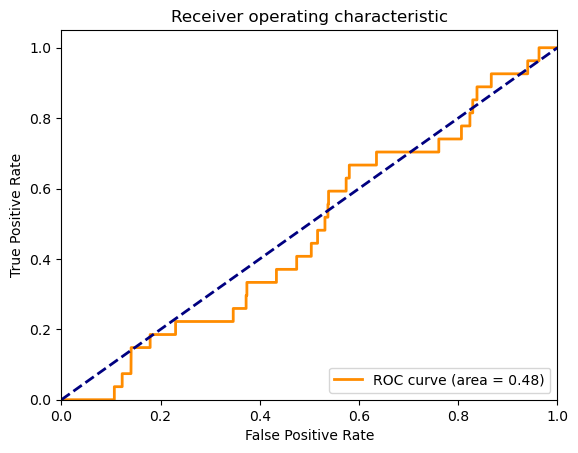

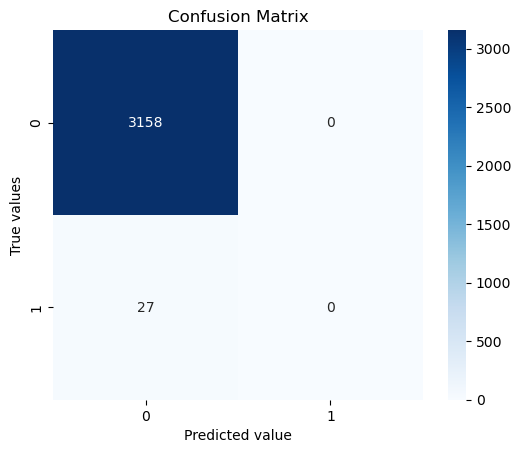

Accuracy of Decision Tree: 99.12%


<Figure size 2500x1000 with 0 Axes>

In [18]:
if __name__ == '__main__':
    crime = api('https://data.boston.gov/api/3/action/datastore_search?resource_id=b973d8cb-eeb2-4e7e-99da-c92938efc9c0&limit=100000')
    print(crime.dtypes)
    crime[['SHOOTING', 'OFFENSE_CODE','MONTH','HOUR','YEAR','INCIDENT_NUMBER']] = crime[['SHOOTING', 'OFFENSE_CODE','MONTH','HOUR','YEAR','INCIDENT_NUMBER']].astype({'SHOOTING' : int, 'OFFENSE_CODE': int,'MONTH' : int,'HOUR': int,'YEAR' : int,'INCIDENT_NUMBER': int})
    crime[['Lat', 'Long','OFFENSE_CODE_GROUP','UCR_PART']] = crime[['Lat', 'Long','OFFENSE_CODE_GROUP','UCR_PART']].astype({'Lat' : float, 'Long' : float,'OFFENSE_CODE_GROUP': float,'UCR_PART': float})
    print(crime.dtypes)
    crime = fill_missing_values(crime, 'DISTRICT', 'mode')
    crime = clean_crime_data(crime)
    cluster = cluster_map(crime)
    display(cluster)
    crime_plot(crime)
    offense_tree(crime)
    shoot = area_shoot(crime)
    display(shoot)
    crime_trend(crime)
    map_obj = culmap(crime,'ROBBERY')
    display(map_obj)
    crime_type(crime)
    month_crime()
    offense()
    shooting_data = crime[crime["SHOOTING"] == 1]
    heatmap_shoot(shooting_data)
    X_train, X_test, y_train, y_test = split_data(crime)
    model, accuracy, y_pred = logistic()
    print("Accuracy of Logistic Regression: {:.2f}%".format(accuracy*100))
    roc(model)
    confusion_log()
    X_train, X_test, y_train, y_test = split_data(crime)
    dtc, accuracy, y_pred_tree = tree()
    print("Accuracy of Decision Tree: {:.2f}%".format(accuracy*100))


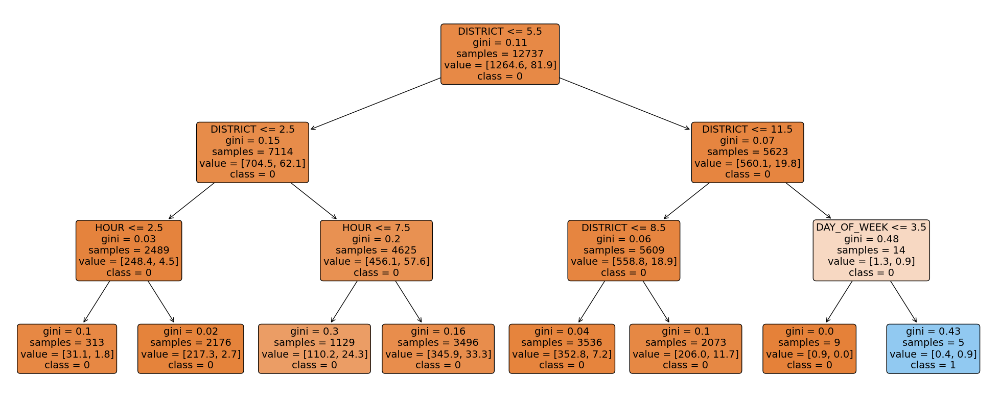

In [22]:
from sklearn import tree

# loading the data
df = crime

# encoding categorical variables
le = LabelEncoder()
df['DISTRICT'] = le.fit_transform(df['DISTRICT'])
df['DAY_OF_WEEK'] = le.fit_transform(df['DAY_OF_WEEK'])
df['STREET'] = le.fit_transform(df['STREET'])

# selecting the features and target variable
X = df[['DISTRICT', 'DAY_OF_WEEK', 'HOUR', 'STREET']]
y = df['SHOOTING']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

class_weights = {0: 0.1, 1: 0.9}

# building the decision tree classifier
dtc = DecisionTreeClassifier(criterion="gini", random_state=42,max_depth=3, min_samples_leaf=5, class_weight=class_weights )   
dtc.fit(X_train, y_train)

plt.figure(figsize = (25,10))
plot=tree.plot_tree(dtc,feature_names = X.columns.values.tolist(),class_names=['0','1'],filled = True,rounded = True,fontsize = 14,precision=2)

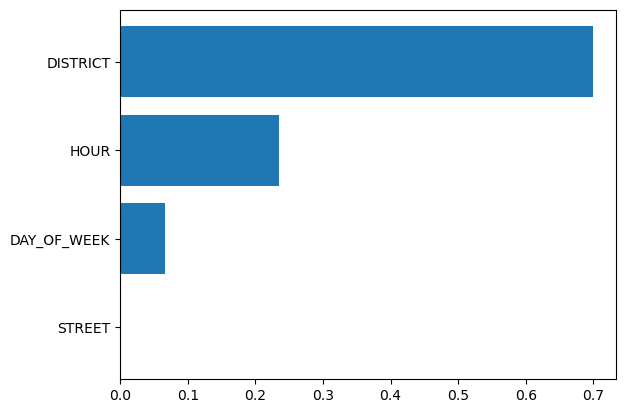

In [20]:
#Feature Importance
from sklearn import tree

importances = dtc.feature_importances_

indices = np.argsort(importances)

fig, ax = plt.subplots()
ax.barh(range(len(importances)), importances[indices])
ax.set_yticks(range(len(importances)))
_ = ax.set_yticklabels(np.array(X_train.columns)[indices])